In [8]:
import math
import json
import numpy as np
import pandas as pd
import networkx as nx
#import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from IPython.display import Image
%matplotlib inline
import os
import conda

conda_file_dir = conda.__file__
conda_dir = conda_file_dir.split('lib')[0]
proj_lib = os.path.join(os.path.join(conda_dir, 'share'), 'proj')
os.environ["PROJ_LIB"] = proj_lib

from mpl_toolkits.basemap import Basemap

In [9]:
cities = pd.read_csv('data/Top50/top50cities.csv',delimiter=',')

In [10]:
#import nodes to get id from nodes/hosts
hosts = pd.DataFrame() #creates a new dataframe that's empty
for idx,city in cities.iterrows():#.loc[cities['2017']>50000].iterrows():
    for p in range(1,14):
        if (os.path.exists('data/Top50/hosts/'+city['name']+str(p)+'.csv')):
            df = pd.read_csv('data/Top50/hosts/'+city['name']+str(p)+'.csv',index_col=False,dtype={'id': np.int64})
            hosts = pd.concat([hosts,df]).reset_index(drop=True)
print(len(hosts))
hosts=hosts.drop_duplicates()
print(len(hosts))


10586
10582


In [11]:
hosts['lat']='NaN'
hosts['lng']='NaN'
#rev['city']='NaN'
hosts['country']='NaN'
for idx,city in cities.iterrows():
    l = hosts.loc[hosts.city==city['name']].index.tolist()
    for i in l:
        hosts.set_value(i,'lat',city['lat'])
        hosts.set_value(i,'lng',city['lng'])
        hosts.set_value(i,'city',city['name'].lower())
        hosts.set_value(i,'country',city['countryCode'].lower())
len(hosts.values)

/Users/Eike/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  
/Users/Eike/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  if __name__ == '__main__':
/Users/Eike/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  # Remove the CWD from sys.path while we load stuff.
/Users/Eike/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  # This is added back by InteractiveShellApp.init_path()


10582

In [12]:
rev= pd.read_csv('data/reviews_total_geo_3.csv',dtype={'id':np.int64})


/Users/Eike/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (5,6,7,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [14]:
#drop entries that couldn't be found in the preprocessing part
print(len(rev))
rev=rev[pd.to_numeric(rev['lat'], errors='coerce').notnull()]
rev=rev[pd.to_numeric(rev['lng'], errors='coerce').notnull()]
rev=rev[pd.to_numeric(rev['to'], errors='coerce').notnull()]
rev=rev[pd.to_numeric(rev['from'], errors='coerce').notnull()]
rev['to']=rev['to'].astype('int64')
rev['from']=rev['from'].astype('int64')
#52.52000659999999 13.404953999999975

96085


In [169]:
rev.loc[rev.city=='moscow']['lat'].unique()

array([55.752222, 55.81363 ])

In [165]:
#Reducing noise for wrong assignment of geo position of london
k=rev.loc[rev.city=='berlin'].index.tolist()
#fo
print(rev.loc[rev.city=='berlin']['lat'].mode().values[0])
print(rev.loc[rev.city=='berlin']['lng'].mode().values[0])
#51.514125 -0.093689 real london
for i in k:
    rev.set_value(i,'lat','52.52000659999999')
    rev.set_value(i,'lng','13.404953999999975')
    rev.set_value(i,'country','de')
export_csv = rev.to_csv ('data/reviews_total_geo_3.csv', index = None, header=True)

52.52000659999999
13.404953999999975


/Users/Eike/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  
/Users/Eike/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  if __name__ == '__main__':
/Users/Eike/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  # Remove the CWD from sys.path while we load stuff.


In [144]:
G = nx.MultiDiGraph()
#Add hosts to the network
G.add_nodes_from([(rows['id'],{'city':rows['city'],'lat':rows['lat'],'lng':rows['lng']}) for idx,rows in hosts.iterrows()])
#Add users to the network from the source reviews/surfers and hosts
G.add_nodes_from([(rows['from'],{'city':rows['city'],'lat':rows['lat'],'lng':rows['lng']}) for idx,rows in rev.iterrows()])
G.number_of_nodes()


91561

In [146]:
G.remove_edges_from(list(G.edges()))
for idx,r in rev.iterrows():
    if r['from'] in G and r['to'] in G:
        if r['relationshipType']=='surf':
            G.add_edge(int(r['from']),r['to'])
        if r['relationshipType']=='host':
            G.add_edge(int(r['to']),int(r['from']))
    else:
        print('...'+str(r['from'])+'...'+str(r['to'])+'...')


...2006181888...2004879441...
...2002062416...2004879441...
...1000562293...2004879441...
...1000211129...2004879441...
...2000614312...2004879441...
...2000796253...2006303896...
...4734890...1003944200...
...2007117438...2007799772...
...1854819...2007799772...
...2008087820...2007799772...
...2003289984...2007799772...
...4434422...2007799772...
...2000252744...681757...
...2000252744...681757...
...642402...681757...
...1064335...681757...
...604115...681757...
...2641774...319013...
...382443...319013...
...1005147832...319013...
...1625257...319013...
...388196...319013...
...2579794...319013...
...1464516...319013...
...2004670...319013...
...3065585...319013...
...2619229...319013...
...3011382...319013...
...2339906...319013...
...1006113853...2004136667...
...1440481...2660323...
...1374135...2660323...
...4095666...2660323...
...2699442...2660323...
...412346...2660323...
...2117149...2660323...
...1509792...2660323...
...1994318...2660323...
...2816747...2660323...
...26125

In [147]:
#pos = {x[0]:(x[1]['lat'], x[1]['lng']) for x in list(G.nodes(data=True))}
#pos
print('number of nodes: ',G.number_of_nodes())
print('number of edges: ',G.number_of_edges())
nx.info(G)

number of nodes:  91561
number of edges:  95128


'Name: \nType: MultiDiGraph\nNumber of nodes: 91561\nNumber of edges: 95128\nAverage in degree:   1.0390\nAverage out degree:   1.0390'

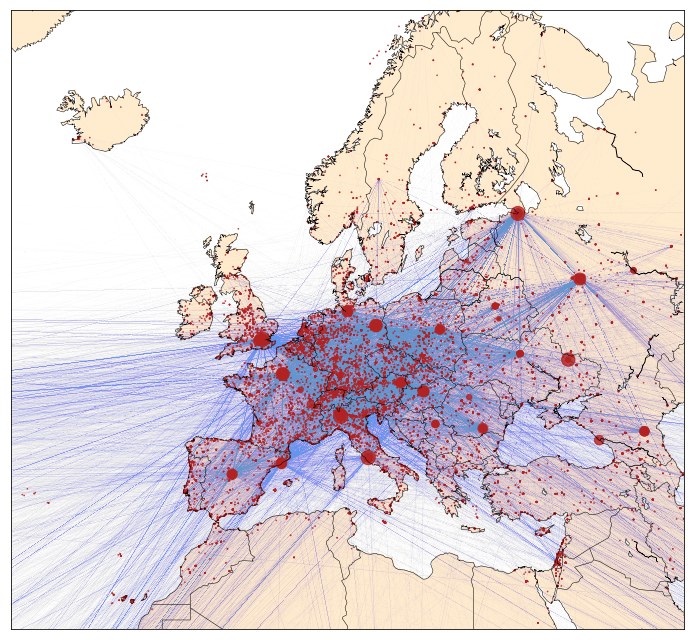

In [148]:
plt.figure(figsize = (10,9))
m = Basemap(projection='merc',llcrnrlon=-30,llcrnrlat=25,urcrnrlon=50,
urcrnrlat=70, lat_ts=0, resolution='l',suppress_ticks=True)
#mx, my = m(cities['lng'].values, cities['lat'].values)
mx,my = m(list(nx.get_node_attributes(G,'lng').values()),list(nx.get_node_attributes(G,'lat').values()))
pos = {}
for count, elem in enumerate(list(G.nodes())):
     pos[elem] = (mx[count], my[count])
m.drawlsmask(land_color='blanchedalmond', ocean_color='w', lsmask=None, lsmask_lons=None, lsmask_lats=None, lakes=True, grid=5)
nx.draw_networkx_nodes(G, pos = pos, node_list =G.nodes() ,node_color = 'firebrick', alpha = 0.8, node_size = [v[1] * 0.5 for v in G.degree()])
nx.draw_networkx_edges(G, pos = pos, edge_color='cornflowerblue', alpha=0.2,width=0.01, arrows = False)
#nx.draw_networkx_edges(G, pos = pos, edge_color='g', alpha=0.2, arrows = False)
m.drawcountries(linewidth = 0.5)
#m.drawstates(linewidth = 0.2)
m.drawcoastlines(linewidth=0.5)
#m.bluemarble()
plt.tight_layout()
plt.savefig("europe_user.png", format = "png", dpi = 300)

plt.show()

In [149]:
#Geocluster
#geodistance function for clustering
from math import sin, cos, sqrt, atan2, radians
def geoDist(loc1,loc2):
    # approximate radius of earth in km
    R = 6373.0

    lat1 = radians(loc1[0])
    lon1 = radians(loc1[1])
    lat2 = radians(loc2[0])
    lon2 = radians(loc2[1])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance

In [170]:
from sklearn.cluster import DBSCAN
def geoCluster(X):
    #no noise is allowed with min_samples=1 , maxDistance(eps)=25km
    clustering = DBSCAN(eps=25, min_samples=1,metric=geoDist).fit(X)
    return clustering.labels_


In [171]:
import pandas as pd
import numpy as np


In [172]:
nodes = G.nodes(data=True)
data={}
data['id']=[x[0] for x in nodes]
data['city'] = [x[1]['city'] for x in nodes]
data['lat'] = [x[1]['lat'] for x in nodes]
data['lng'] = [x[1]['lng'] for x in nodes]
data['cluster']=geoCluster(np.array([(x[1]['lat'],x[1]['lng'])for x in nodes]))
user = pd.DataFrame(data)

In [173]:
grouped = user.groupby('cluster')


In [174]:
X = nx.MultiDiGraph()
X.add_nodes_from([(name,{'city':group.mode()['city'].values[0],'lat':group.mode()['lat'].values[0],'lng':group.mode()['lng'].values[0]}) for name, group in grouped])
X.add_edges_from([(user.loc[user.id==fr]['cluster'].values[0],user.loc[user.id==to]['cluster'].values[0]) for fr,to in  list(G.in_edges())])



[0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 2,
 0,
 0,
 0,
 2,
 0,
 0,
 0,
 1,
 2,
 0,
 1,
 2,
 3,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 3,
 0,
 4,
 1,
 0,
 1,
 4,
 0,
 5,
 2,
 0,
 0,
 2,
 0,
 0,
 6,
 0,
 1,
 0,
 0,
 5,
 0,
 0,
 7,
 8,
 1,
 2,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 3,
 4,
 5,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 2,
 6,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 2,
 0,
 0,
 2,
 6,
 0,
 0,
 3,
 2,
 3,
 0,
 1,
 0,
 1,
 0,
 7,
 8,
 3,
 0,
 0,
 0,
 0,
 0,
 1,
 2,
 1,
 2,
 0,
 0,
 3,
 0,
 0,
 9,
 10,
 0,
 1,
 2,
 0,
 0,
 0,
 1,
 3,
 4,
 0,
 0,
 5,
 0,
 0,
 0,
 1,
 0,
 11,
 0,
 12,
 9,
 1,
 3,
 0,
 0,
 3,
 0,
 0,
 1,
 0,
 13,
 0,
 0,
 4,
 1,
 0,
 14,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 1,
 15,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 2,
 2,
 0,
 0,
 0,
 0,
 4,
 0,
 4,
 0,
 16,
 3,
 0,
 0,
 0,
 0,
 0,
 

In [175]:
def plotCityDegDistrib(deg,title):
    #fig = plt.bar(range(len(deg)-1),deg,figsize=(20,9))
    labels=[user.loc[user.cluster==key]['city'].mode().values[0].title() for key,val in deg]
    ys=[val for key,val in deg]
    xs = np.arange(len(labels)) 
    width = 0.8

    fig = plt.figure(figsize=(13,5))                                                               
    ax = fig.gca()  #get current axes
    p=ax.bar(xs, ys, width, align='center')

    #Remove the default x-axis tick numbers and  
    #use tick numbers of your own choosing:
    ax.set_xticks(xs)
    #Replace the tick numbers with strings:
    ax.set_xticklabels(labels,rotation='vertical')
    ax.set_title(title)
    ax.set_facecolor('#ffffff')

    plt.tight_layout()
    plt.savefig("data/results/results_geo/"+title+"_distribution.png", format = "png", dpi = 300, transparent=True)



In [176]:
def plotEuropeDegree(degX,title):
    fig =plt.figure(figsize = (10,9))
    ax = fig.gca()
    m = Basemap(projection='merc',llcrnrlon=-30,llcrnrlat=25,urcrnrlon=50,
    urcrnrlat=70, lat_ts=0, resolution='l',suppress_ticks=True)
    #mx, my = m(cities['lng'].values, cities['lat'].values)
    mx,my = m(list(nx.get_node_attributes(X,'lng').values()),list(nx.get_node_attributes(X,'lat').values()))
    pos = {}
    for count, elem in enumerate(list(X.nodes())):
         pos[elem] = (mx[count], my[count])
    m.drawlsmask(land_color='blanchedalmond', lsmask=None, lsmask_lons=None, lsmask_lats=None, lakes=True, grid=5)
    nx.draw_networkx_nodes(X, pos = pos, node_list =X.nodes() ,node_color = 'firebrick', alpha = 0.8, node_size = [v[1] * 0.08 for v in degX])
    nx.draw_networkx_edges(X, pos = pos, edge_color='cornflowerblue', alpha=0.2,width=0.01, arrows = False)
    #nx.draw_networkx_edges(G, pos = pos, edge_color='g', alpha=0.2, arrows = False)
    m.drawcountries(linewidth = 0.5)
    #m.drawstates(linewidth = 0.2)
    m.drawcoastlines(linewidth=0.5)
    #m.bluemarble()
    ax.set_facecolor('#ffffff')
    plt.tight_layout()
    plt.savefig("data/results/results_geo/"+title+"_map.png", format = "png", dpi = 300, transparent=True)

    plt.show()

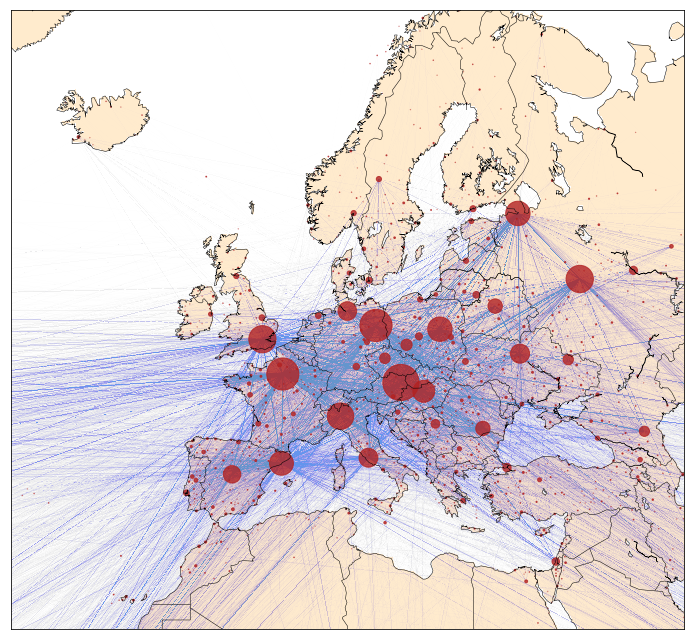

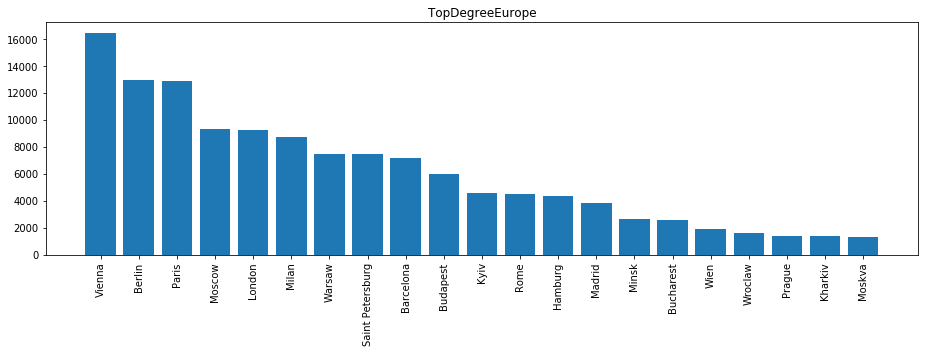

In [177]:
deg=sorted(X.degree(), key=lambda x: x[1], reverse=True)[0:21]

plotEuropeDegree(X.degree(),'TopDegreeEurop')
plotCityDegDistrib(deg,'TopDegreeEurope')

In [192]:
X.degree(33)

6000

### Which is the most visited City based on the number of visits?

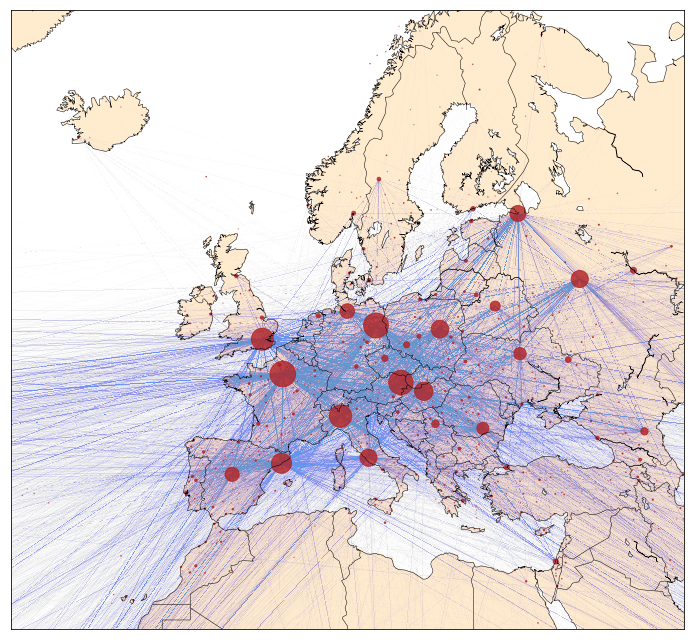

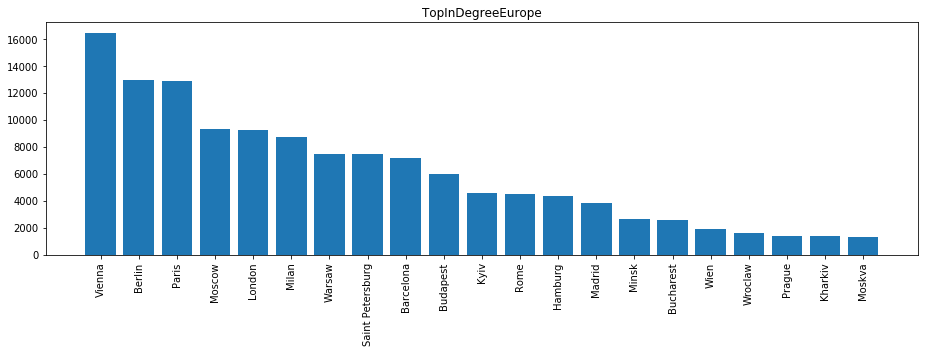

In [190]:
in_deg=sorted(X.in_degree(), key=lambda x: x[1], reverse=True)[0:21]

plotEuropeDegree(X.in_degree(),'TopInDegreeEurop')
plotCityDegDistrib(deg,'TopInDegreeEurope')

### Which is the most surfing City based on the number of "surfs"?

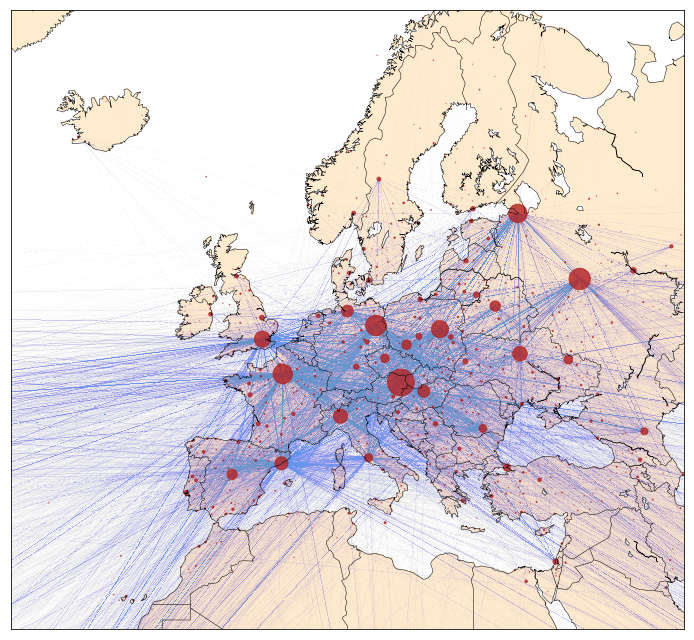

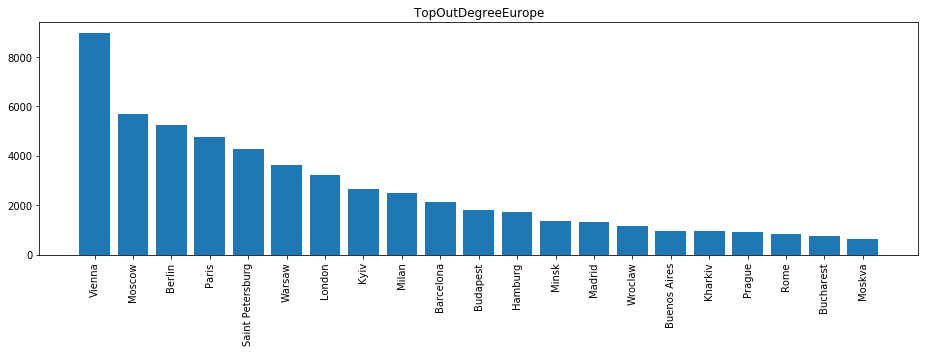

In [191]:
out_deg=sorted(X.out_degree(), key=lambda x: x[1], reverse=True)[0:21]

plotEuropeDegree(X.out_degree(),'TopOutDegreeEurop')
plotCityDegDistrib(out_deg,'TopOutDegreeEurope')

Where are the people from the most traveling cities going to?

In [193]:
def plotTravelCityDegDistrib(deg,title):
    #fig = plt.bar(range(len(deg)-1),deg,figsize=(20,9))
    labels=[user.loc[user.cluster==key]['city'].mode().values[0].title() if key!=-1 else "Others" for key,val in deg]
    ys=[val for key,val in deg]
    xs = np.arange(len(labels)) 
    width = 0.8

    fig = plt.figure(figsize=(13,5))                                                               
    ax = fig.gca()  #get current axes
    p=ax.bar(xs, ys, width, align='center')

    #Remove the default x-axis tick numbers and  
    #use tick numbers of your own choosing:
    ax.set_xticks(xs)
    #Replace the tick numbers with strings:
    ax.set_xticklabels(labels,rotation='vertical')
    ax.set_title(title)
    ax.set_facecolor('#ffffff')

    plt.tight_layout()
    plt.savefig("data/results/results_geo/"+title+".png", format = "png", dpi = 300, transparent=True)




In [194]:
def plotEuropeTravelPattern(deg,title,edgelist):
    fig =plt.figure(figsize = (10,9))
    ax = fig.gca()
    m = Basemap(projection='merc',llcrnrlon=-30,llcrnrlat=25,urcrnrlon=50,
    urcrnrlat=70, lat_ts=0, resolution='l',suppress_ticks=True)
    #mx, my = m(cities['lng'].values, cities['lat'].values)
    mx,my = m(list(nx.get_node_attributes(X,'lng').values()),list(nx.get_node_attributes(X,'lat').values()))
    pos = {}
    for count, elem in enumerate(list(X.nodes())):
         pos[elem] = (mx[count], my[count])
    m.drawlsmask(land_color='blanchedalmond', lsmask=None, lsmask_lons=None, lsmask_lats=None, lakes=True, grid=5)
    nx.draw_networkx_nodes(X, pos = pos, node_list =X.nodes() ,node_color = 'firebrick', alpha = 0.8, node_size = deg)
    nx.draw_networkx_edges(X, pos = pos,edgelist= edgelist,edge_color='cornflowerblue', alpha=0.2,width=0.05, arrows = False)
    #nx.draw_networkx_edges(G, pos = pos, edge_color='g', alpha=0.2, arrows = False)
    m.drawcountries(linewidth = 0.5)
    #m.drawstates(linewidth = 0.2)
    m.drawcoastlines(linewidth=0.5)
    #m.bluemarble()
    ax.set_facecolor('#ffffff')
    ax.set_title(title)
    plt.tight_layout()
    plt.savefig("data/results/results_geo/"+title+".png", format = "png", dpi = 300, transparent=True)

    plt.show()

In [195]:
#Where are they traveling to?
def plotTravelToGraphDist(cluster):
    clusterName=user.loc[user.cluster==cluster]['city'].mode().values[0].title()
    deg = {node:float(sum(1 for fr,to in list(X.in_edges(node)) if fr==cluster)) for node in list(X.nodes())}
    most_surfing_cities = sorted(deg.items(), key=lambda kv: kv[1],reverse=True)[0:20]
    deg2 = [float(sum(1 for fr,to in list(X.in_edges(node)) if fr==cluster)) for node in list(X.nodes())]
    plotEuropeTravelPattern(deg2,title="TravelPatternOfPeopleFrom"+clusterName+"Map",edgelist=list(X.out_edges(cluster)))
    plotTravelCityDegDistrib(most_surfing_cities,"TravelPatternOfPeopleFrom"+clusterName+"Dist")
#most_surfing_cities

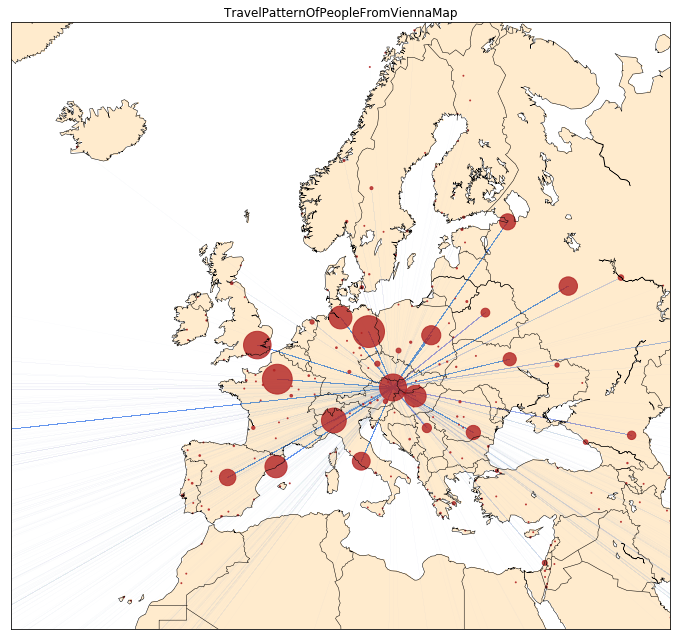

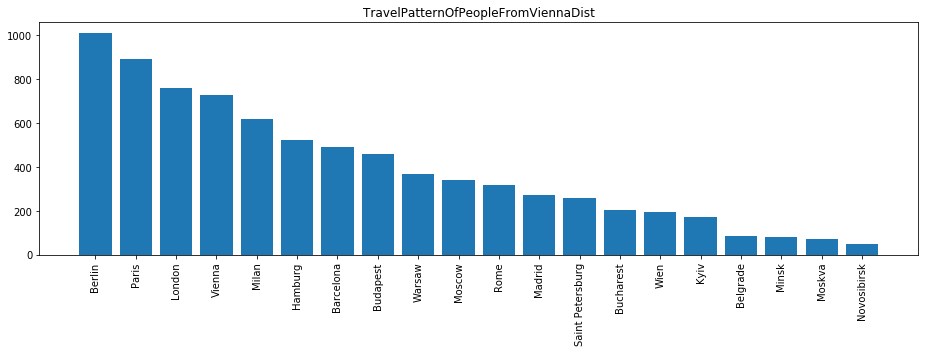

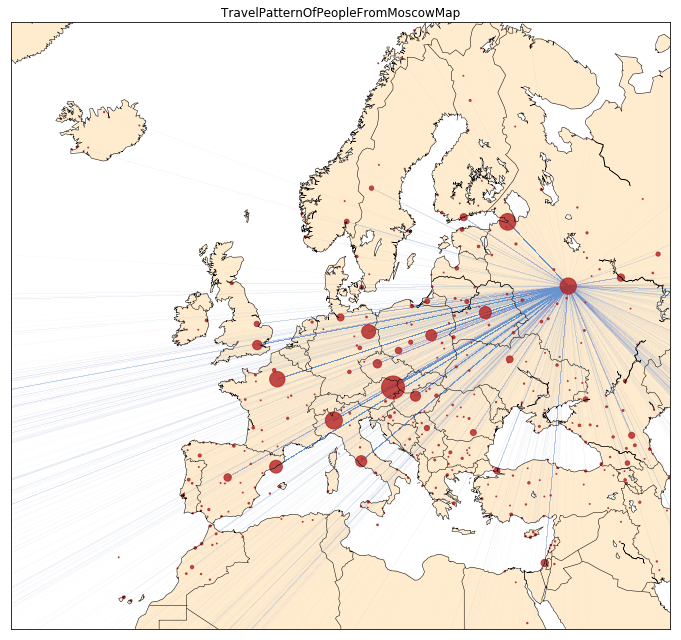

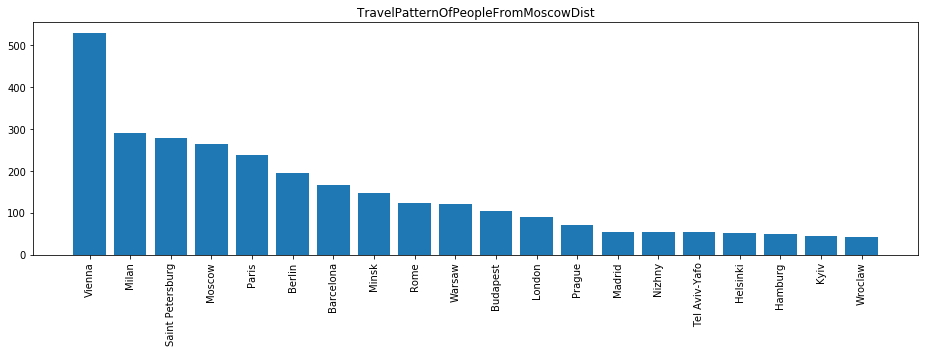

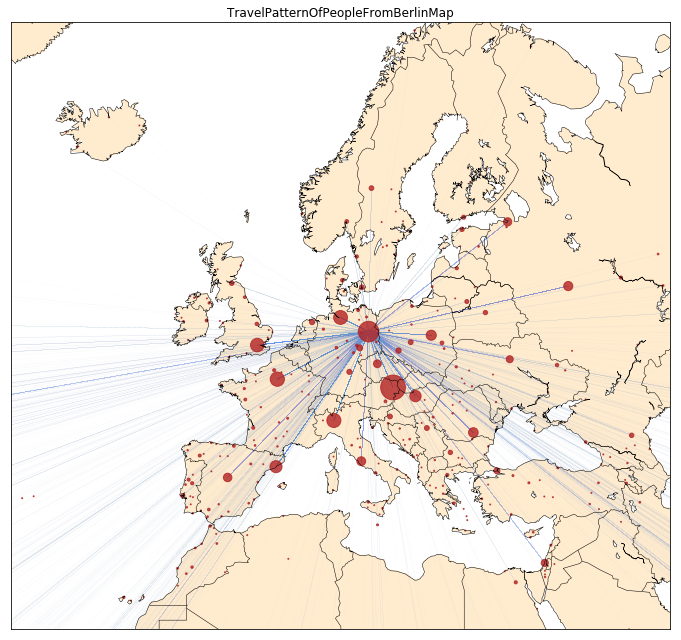

...

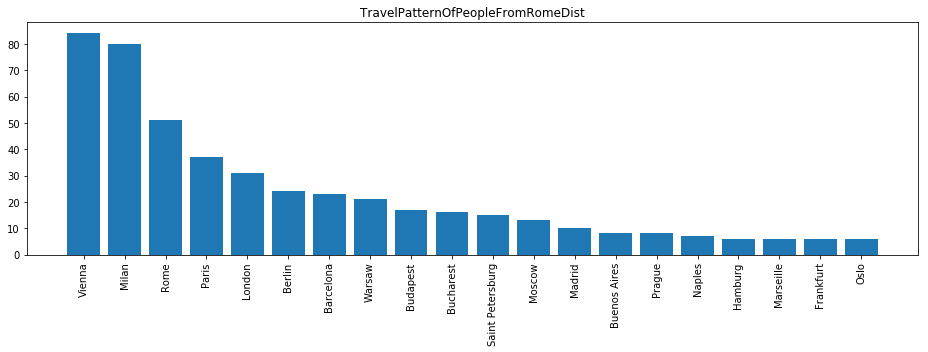

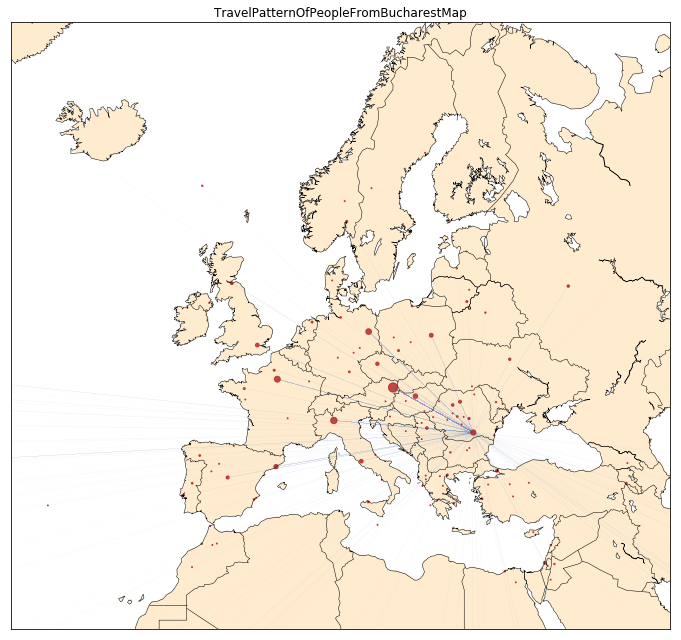

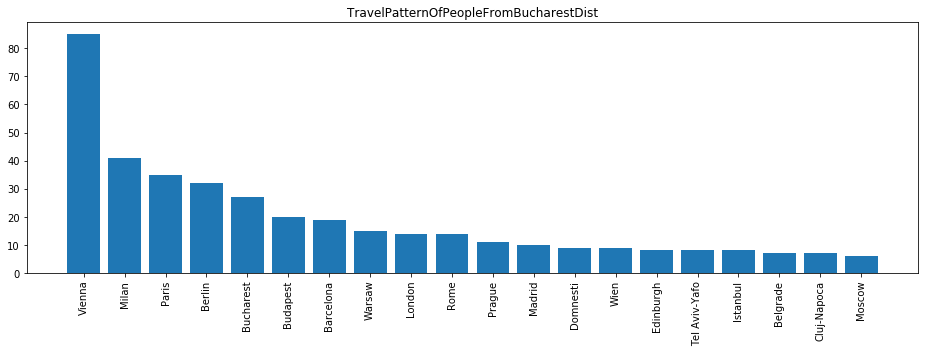

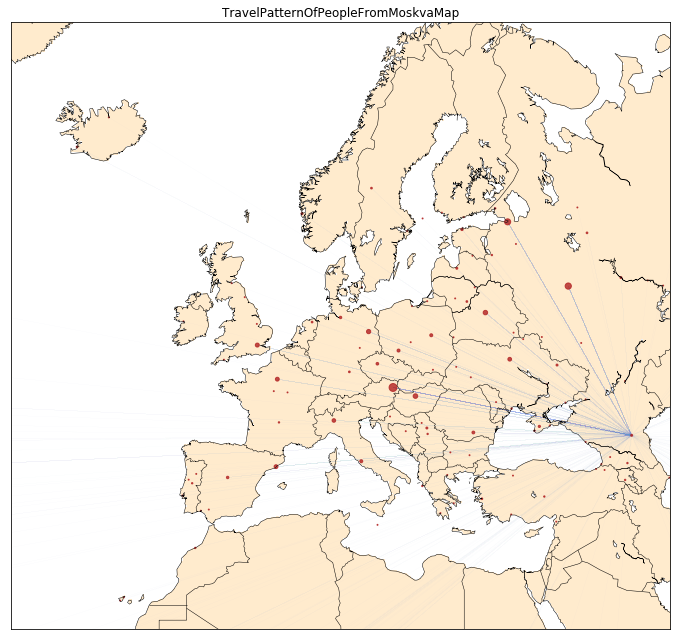

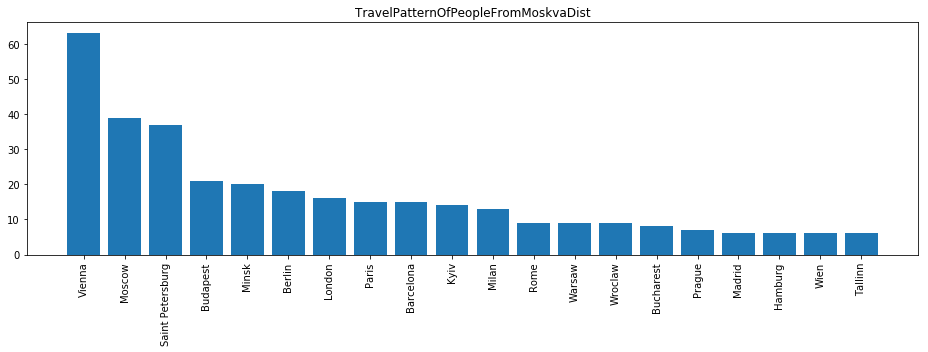

In [196]:
 for cluster in [key for key,val in out_deg]:
        plotTravelToGraphDist(cluster)
        #print(cluster)

In [197]:
#Where are they traveling From?
def plotTravelFromGraphDist(cluster):
    clusterName=user.loc[user.cluster==cluster]['city'].mode().values[0].title()
    deg = {node:float(sum(1 for fr,to in list(X.out_edges(node)) if to==cluster)) for node in list(X.nodes())}
    most_surfing_cities = sorted(deg.items(), key=lambda kv: kv[1],reverse=True)[0:20]
    deg2 = [float(sum(1 for fr,to in list(X.out_edges(node)) if to==cluster)) for node in list(X.nodes())]
    plotEuropeTravelPattern(deg2,title="TravelPatternOfPeopleTo"+clusterName+"Map",edgelist=list(X.in_edges(cluster)))
    plotTravelCityDegDistrib(most_surfing_cities,"TravelPatternOfPeopleTo"+clusterName+"Dist")
#most_surfing_cities

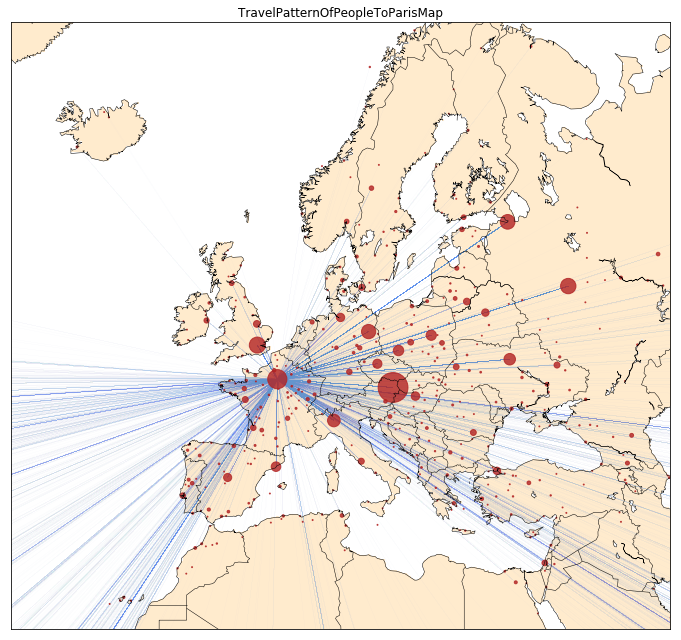

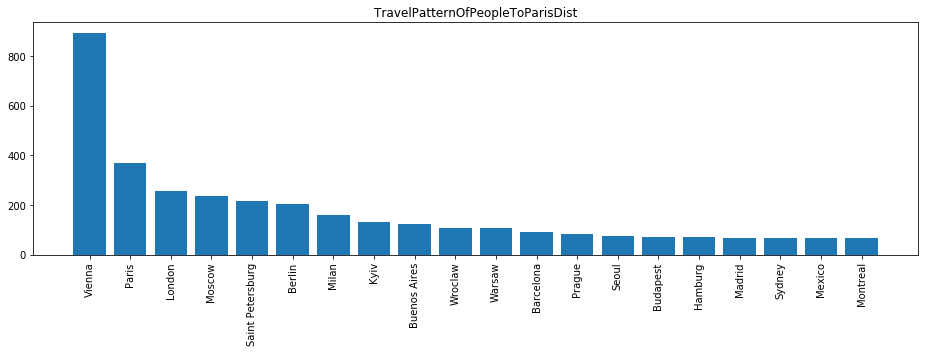

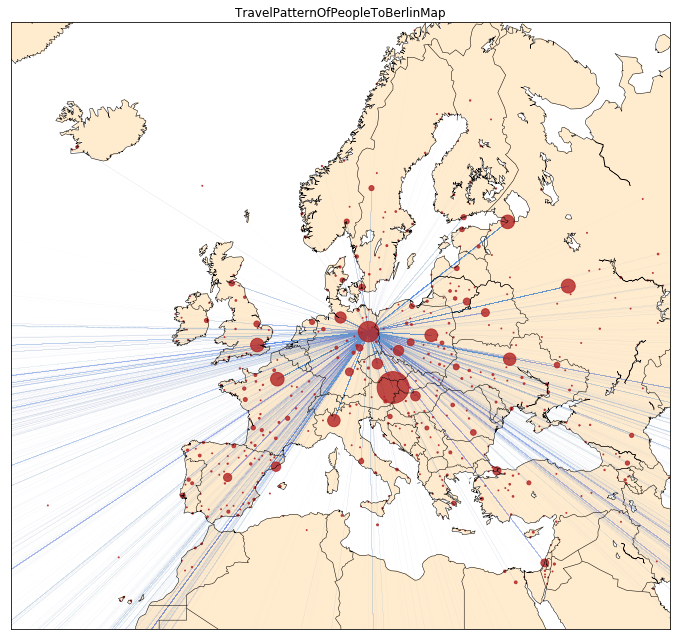

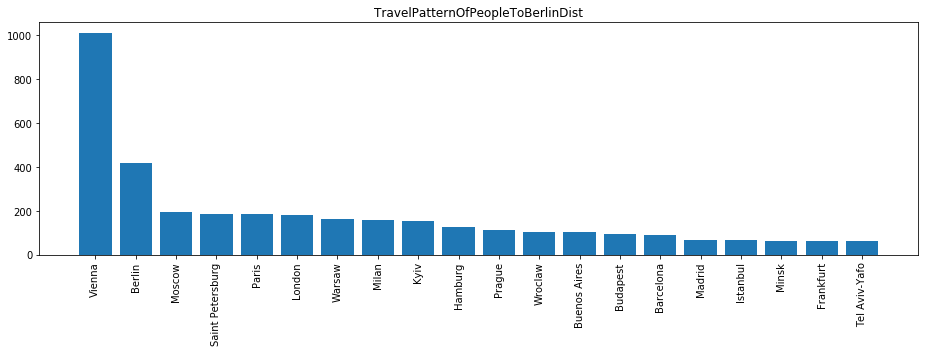

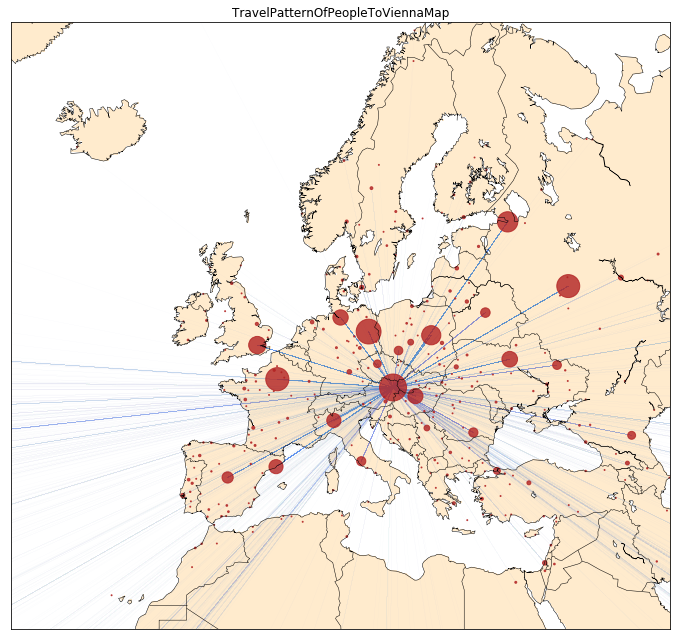

...

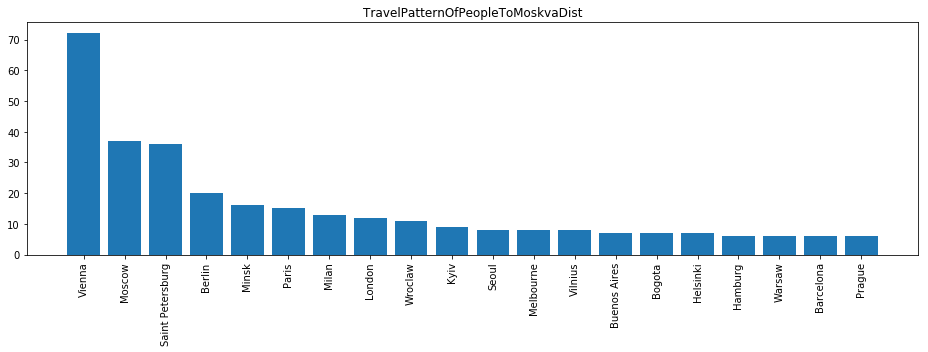

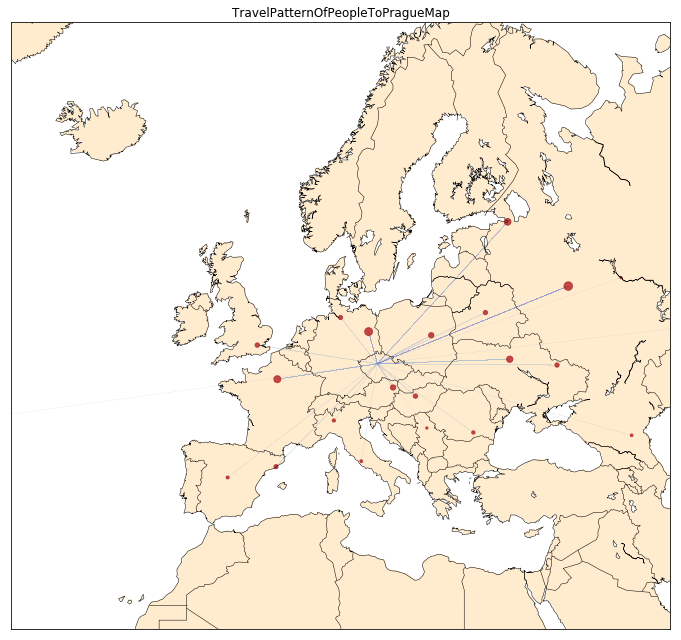

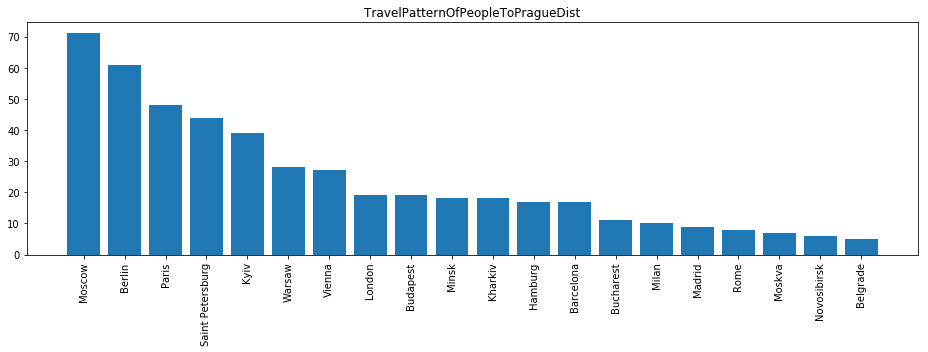

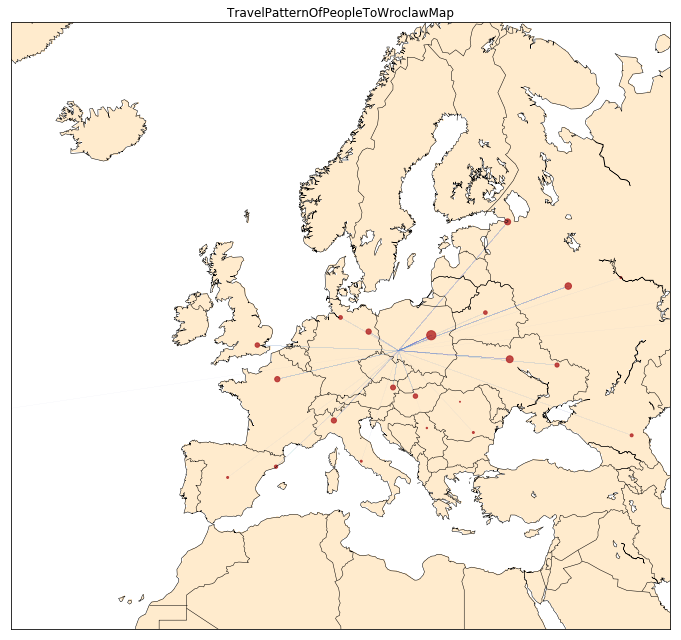

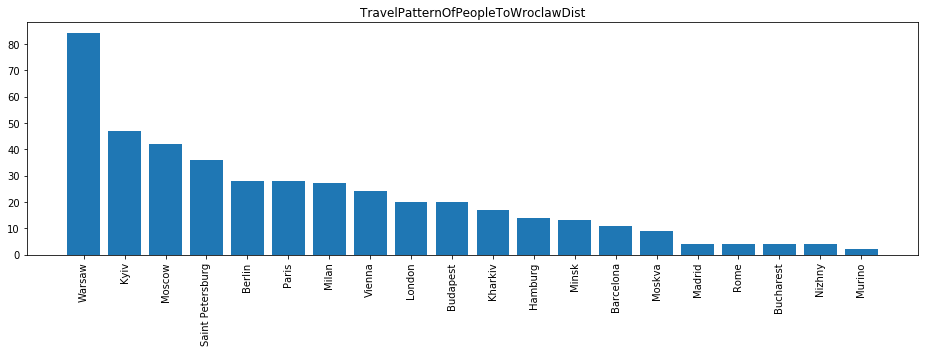

In [198]:
 for cluster in [key for key,val in in_deg]:
        plotTravelFromGraphDist(cluster)
        #print(cluster)

In [188]:
cities = user.groupby('cluster')
cities_in_europe= cities.size().sort_values(ascending=False)[1:40]
#for key, val in cities_in_europe.iteritems():
#    print(key)
labels=[user.loc[user.cluster==key]['city'].mode().values[0].title() for key,val in cities_in_europe_out.iteritems()]
#labels

NameError: name 'cities_in_europe_out' is not defined

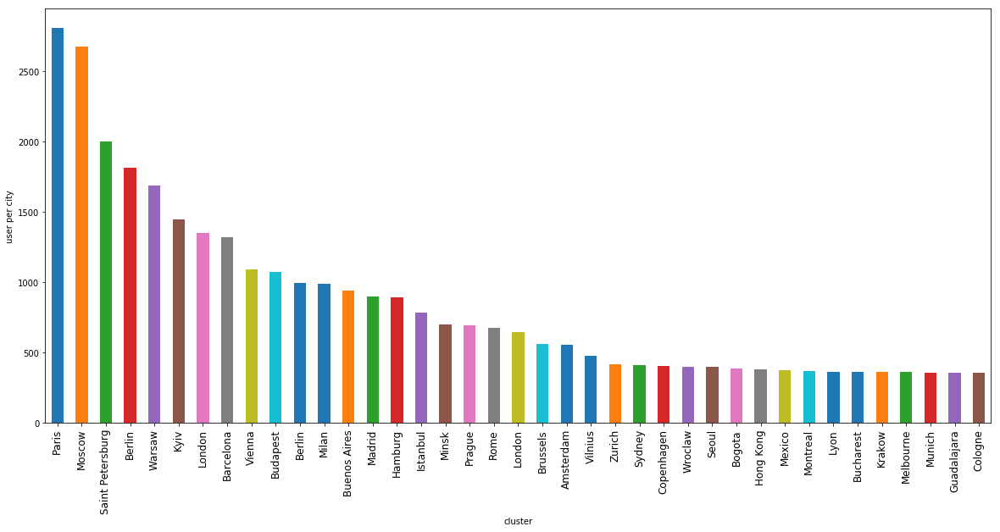

In [103]:
fig = cities_in_europe.plot('bar',figsize=(20,9))
fig.set_xticklabels(labels)
fig.get_xaxis
fig.set_ylabel('user per city')
plt.setp(fig.get_xticklabels(), fontsize=12, rotation='vertical')
plt.savefig('data/results/results_geo/city_dist.png', format = "png", dpi = 300)
plt.show()